In [ ]:
import numpy as np
import os
import json
import tensorflow as tf
import random
import itertools
!pip install mediapipe
import mediapipe as mp
import matplotlib.pyplot as plt
from google.colab import drive
drive.mount('/content/drive')

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 32.9 MB 1.6 MB/s 
Mounted at /content/drive


### Configure MediaPipe FaceMesh

In [ ]:
mp_face_mesh = mp.solutions.face_mesh

### Grab data from training model

In [ ]:
json_path = '/content/drive/Shareddrives/URSI 2022/Eye Tracking ML/json_pose/'
all_json_files = os.listdir(json_path)

json_data = {}
for filename in all_json_files:
  with open(json_path + filename, 'r') as file:
    s_data = json.load(file)
    json_data = {**json_data, **s_data}

### Set training data, training labels, validation data, and validation labels

In [ ]:
left_eye_point = set(sum(mp_face_mesh.FACEMESH_LEFT_EYE, ()))
right_eye_point = set(sum(mp_face_mesh.FACEMESH_RIGHT_EYE, ()))
left_iris_point = set(sum(mp_face_mesh.FACEMESH_LEFT_IRIS, ()))
right_iris_point = set(sum(mp_face_mesh.FACEMESH_RIGHT_IRIS, ()))

face_oval_point = set(sum(mp_face_mesh.FACEMESH_FACE_OVAL, ()))

#keypoints = left_eye_point.union(right_eye_point).union(left_iris_point).union(right_iris_point)

keypoints = left_eye_point.union(right_eye_point).union(face_oval_point)

keypoints = sorted(list(keypoints))

In [ ]:
train_x = []

for subject in json_data:
  subject_data = json_data[subject];
  
  for video in subject_data:
    for all_features in video['features']:
      train_x.append([all_features[i] for i in keypoints])
        

In [ ]:
random.shuffle(train_x)

val_x = train_x[-6623:len(train_x)]
train_x = train_x[0:len(train_x) - 6623]

In [ ]:
len(train_x)

19866

### Transformation Functions for Data Augmentation

In [ ]:
def translate(arr, x_translation, y_translation):
    translated_arr = []
    for element in arr:
        x = element[0] + x_translation
        y = element[1] + y_translation
        z = element[2]
        translated_arr.append([x, y, z])
    return translated_arr

In [ ]:
def rotate(arr, angle):
    i = 0
    rotated_arr = []
    for element in arr:
        x = element[0] * np.cos(angle * (np.pi / 180)) - element[1] * np.sin(angle * (np.pi / 180))
        y = element[0] * np.sin(angle * (np.pi / 180)) + element[1] * np.cos(angle * (np.pi / 180))
        z = element[2]
        rotated_arr.append([x, y, z])
        #print(rotated_arr)
        i += 1
    return rotated_arr

In [ ]:
def rotate_around_point(arr, angle, center_point):
    i = 0
    rotated_arr = []
    for element in arr:
        x = (((element[0] - center_point[0]) * np.cos(angle * (np.pi / 180)) 
        - (element[1] - center_point[1]) * np.sin(angle * (np.pi / 180))) 
        + center_point[0])

        y = (((element[0] - center_point[0]) * np.sin(angle * (np.pi / 180)) 
        + (element[1] - center_point[1]) * np.cos(angle * (np.pi / 180)))
        + center_point[1])

        z = element[2]
        rotated_arr.append([x, y, z])
        #print(rotated_arr)
        i += 1
    return rotated_arr

In [ ]:
def mirror(arr):
    i = 0
    mirrored_arr = []
    for element in arr:
        x = 0.5 - (element[0] - 0.5)
        y = element[1]
        z = element[2]
        mirrored_arr.append([x, y, z])
        i += 1
    return mirrored_arr

In [ ]:
def mirror_along_line(arr, line):
    i = 0
    mirrored_arr = []
    for element in arr:
        x = element[0] 
        y = element[1]
        z = element[2]
        mirrored_arr.append([x, y, z])
        i += 1
    return mirrored_arr

### Test Transformations

In [ ]:
index = 100

(1.0, 0.0)

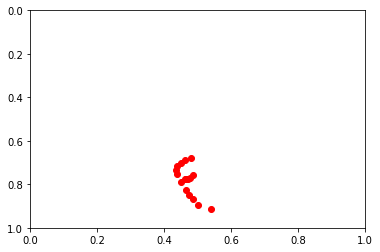

In [ ]:
i = 0
#43/44
#16/17
while i < 17:
    plt.plot(train_x[100][i][0], train_x[100][i][1], 'ro')
    i += 1
plt.xlim([0,1])
plt.ylim([1,0])

0.9134376645088196
0.6666702628135681
0.08656233549118042
0.3333297371864319
0.08656233549118042
0.3333297371864319


(1.0, 0.0)

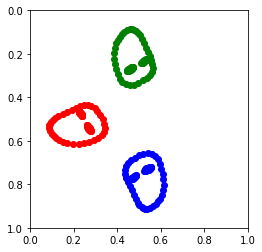

In [ ]:
i = 0
fig = plt.figure()
ax = fig.add_subplot()
ax.set_aspect('equal', adjustable='box')

example = np.array(train_x[index])
for element in example:
    plt.plot(element[0], element[1], 'bo')
    if i == 43 or i == 16:
        print(element[1])
    i += 1

#Translates as expected
#translated_example = translate(train_x[index], 0.3, 0.0)
#for element in translated_example:
#    plt.plot(element[0], element[1], 'go')

#Mirrors as expected
#mirrored_example = mirror(train_x[index])
#for element in mirrored_example:
#    plt.plot(element[0], element[1], 'go')

i = 0
rotated_example = rotate_around_point(train_x[index], 90, [0.5, 0.5])
for element in rotated_example:
    plt.plot(element[0], element[1], 'ro')
    if i == 43 or i == 16:
        print(element[0])
    i += 1

i = 0
rotated_example = rotate_around_point(train_x[index], 180, [0.5, 0.5])
for element in rotated_example:
    plt.plot(element[0], element[1], 'go')
    if i == 43 or i == 16:
        print(element[1])
    i += 1

plt.xlim([0,1])
plt.ylim([1,0])



###Examine Validation Data

(1.0, 0.0)

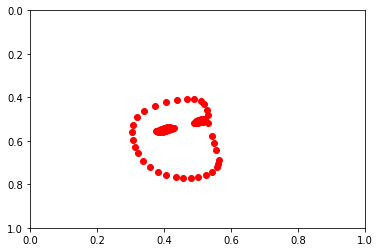

In [ ]:
#k = 0
#while k < 100:
fig = plt.figure()
i = 0
k = 5000
while i < 63:
    plt.plot(val_x[k][i][0], val_x[k][i][1], 'ro')
    i += 1
plt.xlim([0,1])
plt.ylim([1,0])
#k += 1

Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py", line 196, in process
    func(*args, **kwargs)
  File "/usr/local/lib/python3.7/dist-packages/matplotlib/animation.py", line 951, in _start
    self._init_draw()
  File "/usr/local/lib/python3.7/dist-packages/matplotlib/animation.py", line 1743, in _init_draw
    self._draw_frame(next(self.new_frame_seq()))
  File "/usr/local/lib/python3.7/dist-packages/matplotlib/animation.py", line 1766, in _draw_frame
    self._drawn_artists = self._func(framedata, *self._args)
  File "<ipython-input-17-c91871fffcbf>", line 24, in update
    while k < len(val_x[i]):
IndexError: list index out of range


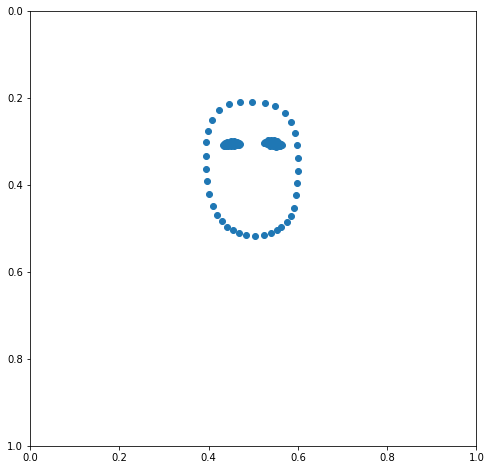

In [ ]:
from matplotlib.animation import FuncAnimation

i = 0
k = 0
x = []
y = []

while k < len(val_x[i]):
    x.append(val_x[i][k][0])
    y.append(val_x[i][k][1])
    k +=1

fig = plt.figure(figsize=(8,8))
ax = plt.axes(xlim=(0,1),ylim=(1,0))
scatter = ax.scatter(x, y)

def update(n):
    x = []
    y = []
    k = 0
    global i
    coords = []

    while k < len(val_x[i]):
        x.append(val_x[i][k][0])
        y.append(val_x[i][k][1])
        coords.append([val_x[i][k][0], val_x[i][k][1]])
        k +=1
    scatter.set_offsets(coords)
    i += 1
    return scatter

anim = FuncAnimation(fig, update, frames=(len(val_x) - 1), interval=60)
from IPython.display import HTML
HTML(anim.to_html5_video())

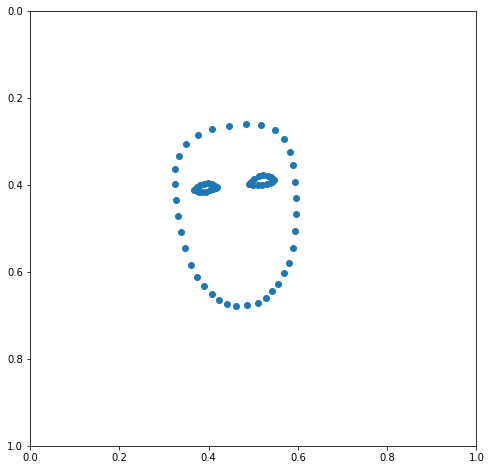

In [ ]:
from matplotlib.animation import FuncAnimation

i = 0
k = 0
x = []
y = []

while k < len(train_x[i]):
    x.append(train_x[i][k][0])
    y.append(train_x[i][k][1])
    k +=1

fig = plt.figure(figsize=(8,8))
ax = plt.axes(xlim=(0,1),ylim=(1,0))
scatter = ax.scatter(x, y)

def update(n):
    x = []
    y = []
    k = 0
    global i
    coords = []

    while k < len(train_x[i]):
        x.append(train_x[i][k][0])
        y.append(train_x[i][k][1])
        coords.append([train_x[i][k][0], train_x[i][k][1]])
        k +=1
    scatter.set_offsets(coords)
    i += 1
    return scatter

anim = FuncAnimation(fig, update, frames=(30 - 1), interval=60)
from IPython.display import HTML
HTML(anim.to_html5_video())

In [ ]:
def drawframe(n):
    i = 0
    while i < 63:
        x = val_x[n][i][0]
        y = val_x[n][i][1]
        mesh = plt.plot(x, y, 'ro')
        i += 1
    return mesh

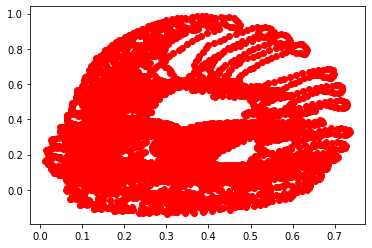

In [ ]:
from matplotlib import animation

anim = animation.FuncAnimation(fig, drawframe, frames=100, interval=20, blit=True)

from IPython.display import HTML
HTML(anim.to_html5_video())


### Augment Dataset

In [ ]:
length = len(train_x)
i = 0
while(i < length):
    train_x.append(rotate_around_point(train_x[i], 25, [0.5, 0.5]))
    train_x.append(mirror(train_x[i]))
    train_x.append(translate(train_x[i], 0.03, 0.03))
    #train_x.append(rotate_around_point(mirror(train_x[i]), 25, [0.5, 0.5]))
    i += 1
print(np.shape(train_x))

(79464, 68, 3)


### VAE Setup

In [ ]:
class Sampling(tf.keras.layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a mesh."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))

        kl_loss = 1/600 * -0.5 * tf.reduce_mean(z_log_var - tf.square(z_mean) - tf.exp(z_log_var) + 1)
        self.add_loss(kl_loss)
        self.add_metric(kl_loss, name='kl_loss')

        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

In [ ]:
len(train_x[0])

68

In [ ]:
latent_dim = 4
features = len(train_x[0])

vae_encoder_inputs = tf.keras.Input(shape=(features,3), name="vae_encoder_input")
vae_encoder_flatten = tf.keras.layers.Flatten(name="vae_flatten")(vae_encoder_inputs)
vae_encoder_dense_1 = tf.keras.layers.Dense(units=200, activation="relu", name="vae_dense_1")(vae_encoder_flatten)
vae_encoder_dense_2 = tf.keras.layers.Dense(units=100, activation="relu", name="vae_dense_2")(vae_encoder_dense_1)
vae_encoder_dense_3 = tf.keras.layers.Dense(units=50, activation="relu", name="vae_dense_3")(vae_encoder_dense_2)
z_mean = tf.keras.layers.Dense(units=latent_dim, name="z_mean")(vae_encoder_dense_3)
z_log_var = tf.keras.layers.Dense(units=latent_dim, name="z_log_var")(vae_encoder_dense_3)
vae_encoder = tf.keras.Model(inputs=vae_encoder_inputs, outputs=[z_mean, z_log_var])

vae_encoder.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 vae_encoder_input (InputLayer)  [(None, 68, 3)]     0           []                               
                                                                                                  
 vae_flatten (Flatten)          (None, 204)          0           ['vae_encoder_input[0][0]']      
                                                                                                  
 vae_dense_1 (Dense)            (None, 200)          41000       ['vae_flatten[0][0]']            
                                                                                                  
 vae_dense_2 (Dense)            (None, 100)          20100       ['vae_dense_1[0][0]']            
                                                                                            

In [ ]:
z = Sampling(name="vae_sampling")([z_mean, z_log_var])

vae_decoder_dense_1 = tf.keras.layers.Dense(50, activation="relu", name="vae_decoder_dense_1")(z)
vae_decoder_dense_2 = tf.keras.layers.Dense(100, activation="relu", name="vae_decoder_dense_2")(vae_decoder_dense_1)
vae_decoder_dense_3 = tf.keras.layers.Dense(200, activation="relu", name="vae_decoder_dense_3")(vae_decoder_dense_2)
vae_decoder_dense_4 = tf.keras.layers.Dense(features*3, activation=None, name="vae_decoder_dense_4")(vae_decoder_dense_3)
vae_decoder_outputs = tf.keras.layers.Reshape((features,3), name="vae_decoder_reshape")(vae_decoder_dense_4)

vae_decoder = tf.keras.Model(inputs=z, outputs=vae_decoder_outputs)

vae_decoder.summary()

Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 4)]               0         
                                                                 
 vae_decoder_dense_1 (Dense)  (None, 50)               250       
                                                                 
 vae_decoder_dense_2 (Dense)  (None, 100)              5100      
                                                                 
 vae_decoder_dense_3 (Dense)  (None, 200)              20200     
                                                                 
 vae_decoder_dense_4 (Dense)  (None, 204)              41004     
                                                                 
 vae_decoder_reshape (Reshap  (None, 68, 3)            0         
 e)                                                              
                                                           

In [ ]:
vae = tf.keras.Model(inputs=vae_encoder_inputs, outputs=vae_decoder_outputs, name="VAE")

vae.summary()

Model: "VAE"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 vae_encoder_input (InputLayer)  [(None, 68, 3)]     0           []                               
                                                                                                  
 vae_flatten (Flatten)          (None, 204)          0           ['vae_encoder_input[0][0]']      
                                                                                                  
 vae_dense_1 (Dense)            (None, 200)          41000       ['vae_flatten[0][0]']            
                                                                                                  
 vae_dense_2 (Dense)            (None, 100)          20100       ['vae_dense_1[0][0]']            
                                                                                                

In [ ]:
vae.compile(optimizer="adam", loss="mean_squared_error", metrics=["mean_squared_error"])

In [ ]:
vae.fit(x=train_x, y=train_x, epochs=50)

Epoch 1/50
621/621 [==============================] - 3s 3ms/step - loss: 0.0107 - mean_squared_error: 0.0078 - kl_loss: 0.0029
Epoch 2/50
621/621 [==============================] - 2s 3ms/step - loss: 0.0049 - mean_squared_error: 0.0024 - kl_loss: 0.0025
Epoch 3/50
621/621 [==============================] - 2s 3ms/step - loss: 0.0046 - mean_squared_error: 0.0023 - kl_loss: 0.0023
Epoch 4/50
621/621 [==============================] - 2s 3ms/step - loss: 0.0044 - mean_squared_error: 0.0023 - kl_loss: 0.0021
Epoch 5/50
621/621 [==============================] - 2s 3ms/step - loss: 0.0043 - mean_squared_error: 0.0023 - kl_loss: 0.0021
Epoch 6/50
621/621 [==============================] - 2s 3ms/step - loss: 0.0042 - mean_squared_error: 0.0022 - kl_loss: 0.0020
Epoch 7/50
621/621 [==============================] - 2s 3ms/step - loss: 0.0041 - mean_squared_error: 0.0021 - kl_loss: 0.0020
Epoch 8/50
621/621 [==============================] - 2s 4ms/step - loss: 0.0041 - mean_squared_error: 0

In [ ]:
vae_encoder_fixed = tf.keras.Model(inputs=vae_encoder_inputs, outputs=z_mean)

vae_fixed = tf.keras.Sequential([vae_encoder_fixed, vae_decoder])

vae_fixed.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 model_5 (Functional)        (None, 4)                 66354     
                                                                 
 model_4 (Functional)        (None, 68, 3)             66554     
                                                                 
Total params: 132,908
Trainable params: 132,908
Non-trainable params: 0
_________________________________________________________________


In [ ]:
vae_fixed.compile(optimizer="adam", loss="mean_squared_error", metrics=["mean_squared_error"])

vae_fixed.fit(x=train_x, y=train_x, epochs=50)

Epoch 1/50
621/621 [==============================] - 3s 3ms/step - loss: 8.3969e-04 - mean_squared_error: 8.3969e-04
Epoch 2/50
621/621 [==============================] - 2s 3ms/step - loss: 5.6322e-04 - mean_squared_error: 5.6322e-04
Epoch 3/50
621/621 [==============================] - 2s 3ms/step - loss: 5.0041e-04 - mean_squared_error: 5.0041e-04
Epoch 4/50
621/621 [==============================] - 2s 3ms/step - loss: 4.6068e-04 - mean_squared_error: 4.6068e-04
Epoch 5/50
621/621 [==============================] - 2s 3ms/step - loss: 4.3158e-04 - mean_squared_error: 4.3158e-04
Epoch 6/50
621/621 [==============================] - 2s 3ms/step - loss: 4.1780e-04 - mean_squared_error: 4.1780e-04
Epoch 7/50
621/621 [==============================] - 2s 3ms/step - loss: 4.0078e-04 - mean_squared_error: 4.0078e-04
Epoch 8/50
621/621 [==============================] - 2s 3ms/step - loss: 3.8848e-04 - mean_squared_error: 3.8848e-04
Epoch 9/50
621/621 [==============================] - 2s

In [ ]:
validation_metrics = vae.evaluate(val_x, val_x)
a = validation_metrics[0]
b = validation_metrics[1]
c = validation_metrics[2]
print(a)
print(b)
print(c)

207/207 [==============================] - 1s 2ms/step - loss: 0.0036 - mean_squared_error: 0.0013 - kl_loss: 0.0023
0.0036108647473156452
0.0013389554806053638
0.0022719164844602346


Epoch 1/50
194/194 [==============================] - 1s 5ms/step - loss: 4.4433e-04 - mean_squared_error: 4.4433e-04
Epoch 2/50
194/194 [==============================] - 1s 5ms/step - loss: 2.8479e-04 - mean_squared_error: 2.8479e-04
Epoch 3/50
194/194 [==============================] - 1s 5ms/step - loss: 2.6889e-04 - mean_squared_error: 2.6889e-04
Epoch 4/50
194/194 [==============================] - 2s 8ms/step - loss: 2.7623e-04 - mean_squared_error: 2.7623e-04
Epoch 5/50
194/194 [==============================] - 2s 9ms/step - loss: 2.7482e-04 - mean_squared_error: 2.7482e-04
Epoch 6/50
194/194 [==============================] - 1s 5ms/step - loss: 2.3570e-04 - mean_squared_error: 2.3570e-04
Epoch 7/50
194/194 [==============================] - 1s 5ms/step - loss: 2.5798e-04 - mean_squared_error: 2.5798e-04
Epoch 8/50
194/194 [==============================] - 1s 6ms/step - loss: 3.0726e-04 - mean_squared_error: 3.0726e-04
Epoch 9/50
194/194 [==============================] - 1s

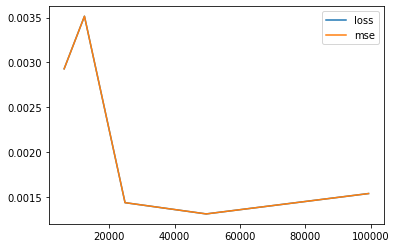

In [ ]:
x = 16
units = []
validation_metrics = []
loss = []
mse = []
kl_loss = []

while (x >= 1):
    vae_input = train_x[len(train_x) - int((len(train_x)) / x):len(train_x)]
    vae_fixed.fit(x=vae_input, y=vae_input, epochs=50)

    units.append(np.shape(vae_input)[0])
    validation_metrics.append(vae_fixed.evaluate(val_x, val_x))
    x = x / 2

for i in validation_metrics:
    loss.append(i[0])
    mse.append(i[1])
    #kl_loss.append(i[2])

plt.plot(units, loss, label='loss')
plt.plot(units, mse, label='mse')
#plt.plot(units, kl_loss, label='kl_loss')
plt.legend()

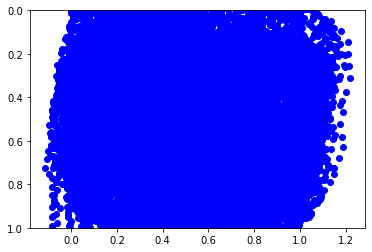

In [ ]:
min_val = -2
max_val = 2
breaks = 5

fig = plt.figure()

prediction_vals = list(itertools.product(np.linspace(min_val, max_val, breaks), repeat = latent_dim))

len(prediction_vals)

len(prediction_vals[0])

points = vae_decoder.predict(prediction_vals)

x_coords = points[:, :, 0]
y_coords = points[:, :, 1]

plt.ylim([1,0])

for i in range(len(x_coords)):
  plt.plot(x_coords[i,:], y_coords[i,:], 'bo')

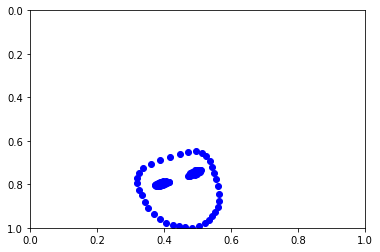

In [ ]:
points = vae_decoder.predict([[2,2,0,0]])

x_coords = points[:, :, 0]
y_coords = points[:, :, 1]

plt.ylim([1,0])
plt.xlim([0,1])
plt.plot(x_coords[0,:], y_coords[0,:], 'bo')

(1.0, 0.0)

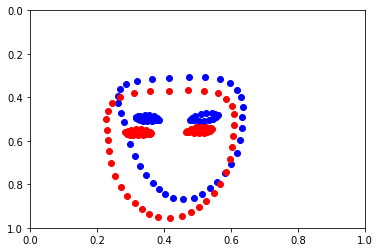

In [ ]:
example = np.array(train_x[900])
reconstructions = vae.predict(np.reshape(example, (1, -1, 3)))

plt.plot(example[:,0], example[:,1], 'bo')
plt.plot(reconstructions[0,:,0], reconstructions[0,:,1], 'ro')
plt.xlim([0,1])
plt.ylim([1,0])

(1.0, 0.0)

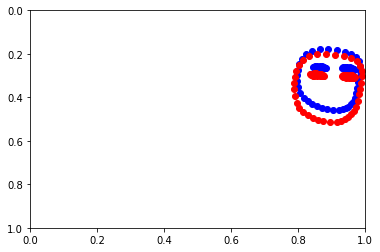

In [ ]:
example = np.array(train_x[4000])
reconstructions = vae_fixed.predict(np.reshape(example, (1, -1, 3)))

plt.plot(example[:,0], example[:,1], 'bo')
plt.plot(reconstructions[0,:,0], reconstructions[0,:,1], 'ro')
plt.xlim([0,1])
plt.ylim([1,0])

(1.0, 0.0)

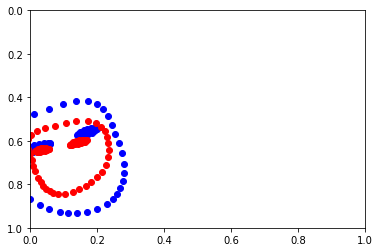

In [ ]:
example = np.array(val_x[1900])
reconstructions = vae_fixed.predict(np.reshape(example, (1, -1, 3)))

plt.plot(example[:,0], example[:,1], 'bo')
plt.plot(reconstructions[0,:,0], reconstructions[0,:,1], 'ro')
plt.xlim([0,1])
plt.ylim([1,0])

In [ ]:
length = len(val_x)
i = 0
while(i < length):
    val_x.append(rotate_around_point(train_x[i], 25, [0.5, 0.5]))
    i += 1
print(np.shape(val_x))

(13246, 68, 3)


In [ ]:
length = len(val_x)
i = 0
while(i < length):
    val_x.append(rotate_around_point(val_x[i], 25, [0.5, 0.5]))
    i += 1
print(np.shape(val_x))

(13246, 68, 3)


[[[ 3.64655942e-01  3.66503119e-01 -5.26759401e-03]
  [ 5.45560479e-01  2.57281333e-01 -1.47125497e-03]
  [ 3.18676054e-01  2.68894225e-01  5.31688593e-02]
  [ 3.59609425e-01  3.58815491e-01 -1.79407001e-03]
  [ 3.56346339e-01  2.41838545e-01  3.02412733e-02]
  [ 2.06992775e-01  5.39006591e-01  8.54848027e-02]
  [ 4.52507585e-01  2.26768613e-01 -6.89169019e-03]
  [ 2.26944819e-01  4.34530437e-01  1.07957259e-01]
  [ 4.00456369e-01  2.26554632e-01  8.40879977e-03]
  [ 4.99057591e-01  2.37521291e-01 -1.00145116e-02]
  [ 2.61697561e-01  3.45481008e-01  1.00288421e-01]
  [ 2.14100003e-01  4.84406888e-01  1.00338861e-01]
  [ 4.32603508e-01  3.90695930e-01  3.61586921e-03]
  [ 2.21052200e-01  6.24047518e-01  4.10582647e-02]
  [ 3.79823267e-01  3.78493130e-01 -1.05126984e-02]
  [ 3.93376231e-01  3.84298712e-01 -1.11147836e-02]
  [ 2.98553407e-01  7.29378104e-01 -6.65400736e-03]
  [ 2.54312754e-01  6.86092973e-01  1.13551710e-02]
  [ 2.37542808e-01  6.60154343e-01  2.40822919e-02]
  [ 3.308503

(1.0, 0.0)

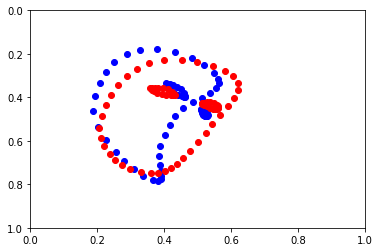

In [ ]:
example = np.array(val_x[900])
reconstructions = vae_fixed.predict(np.reshape(example, (1, -1, 3)))
print(reconstructions)

plt.plot(example[:,0], example[:,1], 'bo')
plt.plot(reconstructions[0,:,0], reconstructions[0,:,1], 'ro')
plt.xlim([0,1])
plt.ylim([1,0])

In [ ]:
from matplotlib.animation import FuncAnimation

j = 0
reconstructions_arr = []
while j < (len(val_x) / 2):
    example = np.array(val_x[j])
    reconstructions = vae_fixed.predict(np.reshape(example, (1, -1, 3)))
    reconstructions_arr.append(reconstructions[0])
    j += 1

i = 0
k = 0
x = []
y = []

while k < len(val_x[i]):
    x.append(val_x[i][k][0])
    y.append(val_x[i][k][1])
    k +=1

fig = plt.figure(figsize=(8,8))
ax = plt.axes(xlim=(0,1),ylim=(1,0))
scatter = ax.scatter(x, y, c='red')
scatter2 = ax.scatter(x, y, c='blue')

def update(n):
    x = []
    y = []
    k = 0
    global i
    coords = []
    coords2 = []

    while k < len(val_x[i]):
        x.append(val_x[i][k][0])
        y.append(val_x[i][k][1])
        coords.append([reconstructions_arr[i][k][0], reconstructions_arr[i][k][1]])
        coords2.append([val_x[i][k][0], val_x[i][k][1]])

        k +=1

    
    scatter.set_offsets(coords)
    scatter2.set_offsets(coords2)
    i += 1
    return scatter, scatter2

anim = FuncAnimation(fig, update, frames=(int(len(val_x) / 2) - 1), interval=60)
from IPython.display import HTML
HTML(anim.to_html5_video())

In [ ]:
len(val_x) / 2
len(val_x)
augmented_val_x = val_x[int(len(val_x) / 2):len(val_x)]
len(augmented_val_x)


3312

In [ ]:
from matplotlib.animation import FuncAnimation

j = 0
reconstructions_arr = []
while j < (len(val_x) / 2):
    example = np.array(val_x[j])
    reconstructions = vae_fixed.predict(np.reshape(example, (1, -1, 3)))
    reconstructions_arr.append(reconstructions[0])
    j += 1

i = 0
k = 0
x = []
y = []

while k < len(val_x[i]):
    x.append(val_x[i][k][0])
    y.append(val_x[i][k][1])
    k +=1

fig = plt.figure(figsize=(8,8))
ax = plt.axes(xlim=(0,1),ylim=(1,0))
scatter = ax.scatter(x, y, c='red')
scatter2 = ax.scatter(x, y, c='blue')

def update(n):
    x = []
    y = []
    k = 0
    global i
    coords = []
    coords2 = []

    while k < len(val_x[i]):
        x.append(val_x[i][k][0])
        y.append(val_x[i][k][1])
        coords.append([reconstructions_arr[i][k][0], reconstructions_arr[i][k][1]])
        coords2.append([val_x[i][k][0], val_x[i][k][1]])

        k +=1

    
    scatter.set_offsets(coords)
    scatter2.set_offsets(coords2)
    i += 1
    return scatter, scatter2

anim = FuncAnimation(fig, update, frames=(int(len(val_x) / 2) - 1), interval=60)
from IPython.display import HTML
HTML(anim.to_html5_video())

In [ ]:
from matplotlib.animation import FuncAnimation

j = 0
reconstructions_arr = []
while j < (len(val_x) / 2):
    example = np.array(val_x[j])
    reconstructions = vae_fixed.predict(np.reshape(example, (1, -1, 3)))
    reconstructions_arr.append(reconstructions[0])
    j += 1

i = 0
k = 0
x = []
y = []

while k < len(val_x[i]):
    x.append(val_x[i][k][0])
    y.append(val_x[i][k][1])
    k +=1

fig = plt.figure(figsize=(8,8))
ax = plt.axes(xlim=(0,1),ylim=(1,0))
scatter = ax.scatter(x, y, c='red')
scatter2 = ax.scatter(x, y, c='blue')

def update(n):
    x = []
    y = []
    k = 0
    global i
    coords = []
    coords2 = []

    while k < len(val_x[i]):
        x.append(val_x[i][k][0])
        y.append(val_x[i][k][1])
        coords.append([reconstructions_arr[i][k][0], reconstructions_arr[i][k][1]])
        coords2.append([val_x[i][k][0], val_x[i][k][1]])

        k +=1

    
    scatter.set_offsets(coords)
    scatter2.set_offsets(coords2)
    i += 1
    return scatter, scatter2

anim = FuncAnimation(fig, update, frames=(int(len(val_x) / 2) - 1), interval=60)
from IPython.display import HTML
HTML(anim.to_html5_video())

In [ ]:
from matplotlib.animation import FuncAnimation

j = 0
reconstructions_arr = []
while j < (len(val_x) / 2):
    example = np.array(augmented_val_x[j])
    reconstructions = vae_fixed.predict(np.reshape(example, (1, -1, 3)))
    reconstructions_arr.append(reconstructions[0])
    j += 1

i = 0
k = 0
x = []
y = []

while k < len(augmented_val_x[i]):
    x.append(augmented_val_x[i][k][0])
    y.append(augmented_val_x[i][k][1])
    k +=1

fig = plt.figure(figsize=(8,8))
ax = plt.axes(xlim=(0,1),ylim=(1,0))
scatter = ax.scatter(x, y, c='red')
scatter2 = ax.scatter(x, y, c='blue')

def update(n):
    x = []
    y = []
    k = 0
    global i
    coords = []
    coords2 = []

    while k < len(augmented_val_x[i]):
        x.append(augmented_val_x[i][k][0])
        y.append(augmented_val_x[i][k][1])
        coords.append([reconstructions_arr[i][k][0], reconstructions_arr[i][k][1]])
        coords2.append([augmented_val_x[i][k][0], augmented_val_x[i][k][1]])

        k +=1

    
    scatter.set_offsets(coords)
    scatter2.set_offsets(coords2)
    i += 1
    return scatter, scatter2

anim = FuncAnimation(fig, update, frames=(int(len(val_x) / 2) - 1), interval=60)
from IPython.display import HTML
HTML(anim.to_html5_video())

In [ ]:
from matplotlib.animation import FuncAnimation

j = 0
reconstructions_arr = []
while j < (len(val_x) / 2):
    example = np.array(augmented_val_x[j])
    reconstructions = vae_fixed.predict(np.reshape(example, (1, -1, 3)))
    reconstructions_arr.append(reconstructions[0])
    j += 1

i = 0
k = 0
x = []
y = []

while k < len(augmented_val_x[i]):
    x.append(augmented_val_x[i][k][0])
    y.append(augmented_val_x[i][k][1])
    k +=1

fig = plt.figure(figsize=(8,8))
ax = plt.axes(xlim=(0,1),ylim=(1,0))
scatter = ax.scatter(x, y, c='red')
scatter2 = ax.scatter(x, y, c='blue')

def update(n):
    x = []
    y = []
    k = 0
    global i
    coords = []
    coords2 = []

    while k < len(augmented_val_x[i]):
        x.append(augmented_val_x[i][k][0])
        y.append(augmented_val_x[i][k][1])
        coords.append([reconstructions_arr[i][k][0], reconstructions_arr[i][k][1]])
        coords2.append([augmented_val_x[i][k][0], augmented_val_x[i][k][1]])

        k +=1

    
    scatter.set_offsets(coords)
    scatter2.set_offsets(coords2)
    i += 1
    return scatter, scatter2

anim = FuncAnimation(fig, update, frames=(int(len(val_x) / 4) - 1), interval=60)
from IPython.display import HTML
HTML(anim.to_html5_video())